In [1]:
%matplotlib inline
## path 바꾸기 -> 한번만 실행
import os
import matplotlib.pyplot as plt
import numpy as np
from darkflow.net.build import TFNet
import cv2
print (os.getcwd()) #현재 디렉토리
darkflow_path = os.path.join(os.getcwd(), 'darkflow')
#디렉토리를 darkflow 안으로 바꿔줌
os.chdir(darkflow_path)
print (os.getcwd())

c:\OCR-SizeTable\OCR_test
c:\OCR-SizeTable\OCR_test\darkflow


# model load

In [2]:
load_weight = 22000

In [3]:
def load_yolo(load_weight):
    # model은 사용하는 cfg model
    options = {"model" : "cfg/size-yolo.cfg",
               "load" : load_weight} # 최신 checkpoint를 load하려면 -1
    tfnet = TFNet(options)
    tfnet.load_from_ckpt()
    return tfnet

In [4]:
tfnet = load_yolo(load_weight)

Parsing cfg/size-yolo.cfg
Loading None ...
Finished in 0.0010001659393310547s

Building net ...
Source | Train? | Layer description                | Output size
-------+--------+----------------------------------+---------------
Instructions for updating:
Colocations handled automatically by placer.
       |        | input                            | (?, 608, 608, 3)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 608, 608, 32)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 304, 304, 32)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 304, 304, 64)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 152, 152, 64)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 152, 152, 128)
 Init  |  Yep!  | conv 1x1p0_1  +bnorm  leaky      | (?, 152, 152, 64)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 152, 152, 128)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 76, 76, 128)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 76,

# boxing 하는 부분

In [203]:
def boxing(original_img , predictions):
    newImage = np.copy(original_img)

    for result in predictions:
        top_x = result['topleft']['x']
        top_y = result['topleft']['y']

        btm_x = result['bottomright']['x']
        btm_y = result['bottomright']['y']
        
        confidence = result['confidence']
        # confidence는 클래스일 확률 
        label = result['label'] + " " + str(round(confidence, 5))
        box_image = newImage
        if confidence > 0.3:
            box_image = original_img[top_y:btm_y, top_x:btm_x]
            newImage = cv2.rectangle(newImage, (top_x, top_y), (btm_x, btm_y), (255,0,0), 3)
            newImage = cv2.putText(newImage, label, (top_x, top_y-5), cv2.FONT_HERSHEY_COMPLEX_SMALL , 0.8, (0, 230, 0), 1, cv2.LINE_AA)
            
    return newImage, box_image

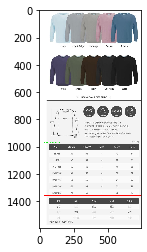

In [608]:
image_path = '../data/testdata/screen_shot_4993_4.jpg'
test_img = cv2.imread(image_path)
reulsts = tfnet.return_predict(test_img)
full_img, box_img = boxing(test_img, reulsts)
plt.imshow(full_img)

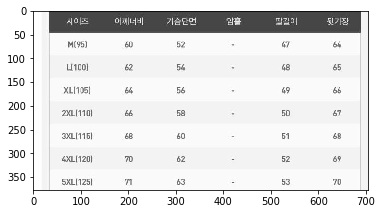

In [609]:
plt.imshow(box_img)

# YOLO predict

In [201]:
def yolo_predict(tfnet, img_path):
    test_img = cv2.imread(img_path)
    #test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
    results = tfnet.return_predict(test_img)
    print(results)
    return boxing(test_img, results)[0]

[{'label': 'table', 'confidence': 0.998381, 'topleft': {'x': 187, 'y': 39}, 'bottomright': {'x': 639, 'y': 190}}]
639 187 190 39


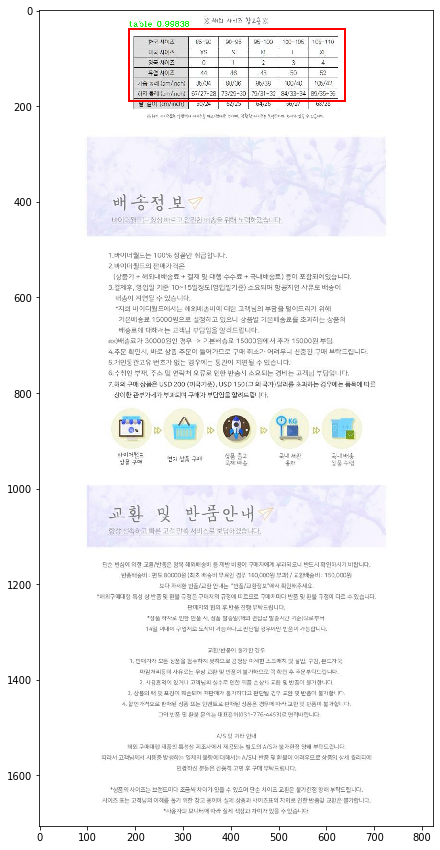

In [56]:
image_path = '../data/dataset/screen_shot_39_2.jpg'
fig, axes = plt.subplots(1, 1, figsize=(15,15))
plt.imshow(yolo_predict(tfnet, image_path))

# test annotations으로 부터 dataset에서 test image불러오기

In [610]:
# test annotations
test_path = '../data/testset'
# total image
data_path = '../data/dataset'

In [620]:
def table_boxing(test_path, data_path, tfnet, test_size):
    # test annotations으로 부터 test set .jpg로 파일 이름 변환
    test_list = [f'{img[:-4]}.jpg' for img in os.listdir(test_path)]
    test_list = test_list[:test_size]
    predict_img = []
    file_list = []
    for idx, img in enumerate(os.listdir(data_path)):
        if img in test_list:
            if idx % 10 == 0:
                print(f'{idx}...')
            file_list.append(img)
            img_path = os.path.join(data_path, img)
            img_ = cv2.imread(img_path)
            # 예측 하는 부분
            results = tfnet.return_predict(img_)
            predict_img.append(boxing(img_, results)[0])
    return predict_img, file_list

In [621]:
predict_img, file_list = table_boxing(test_path, data_path, tfnet, 10)

17270...


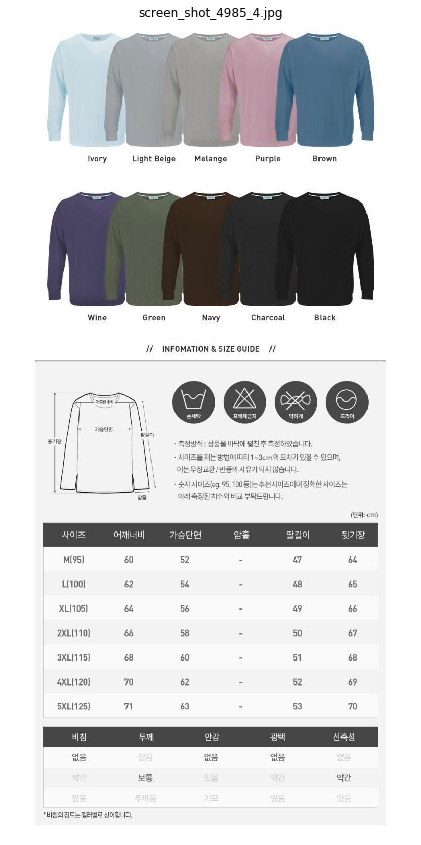

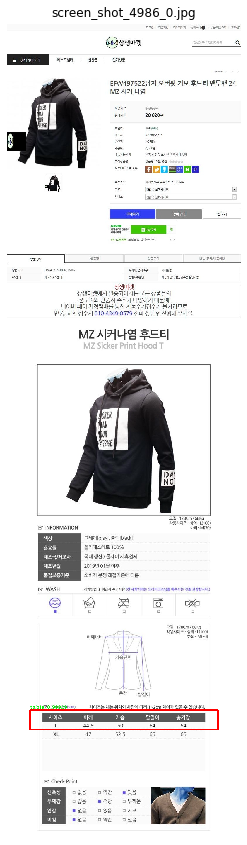

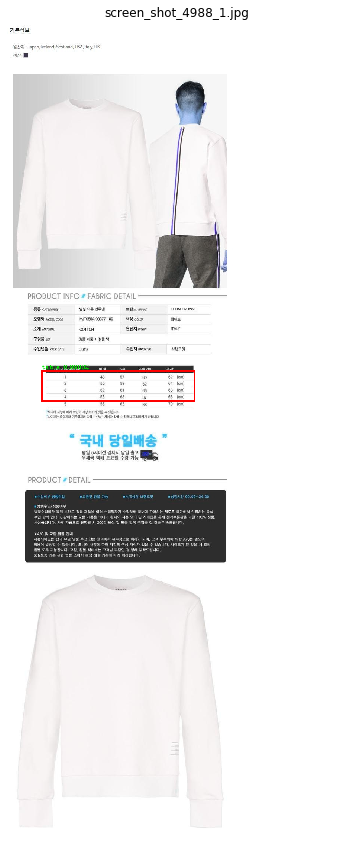

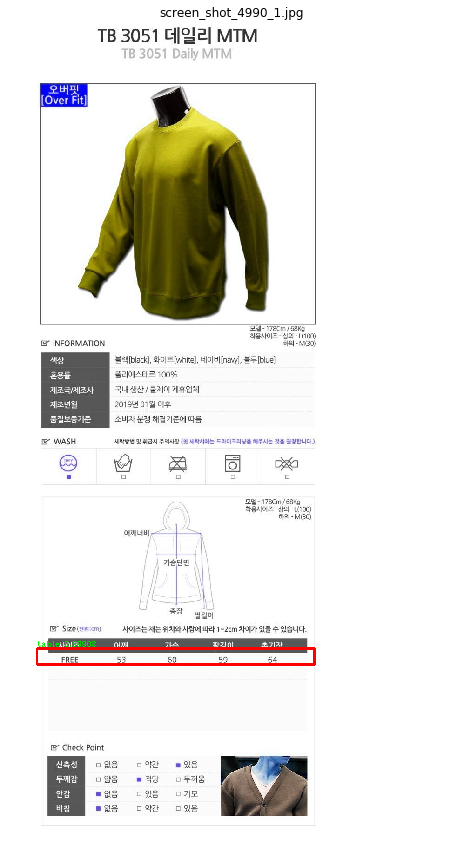

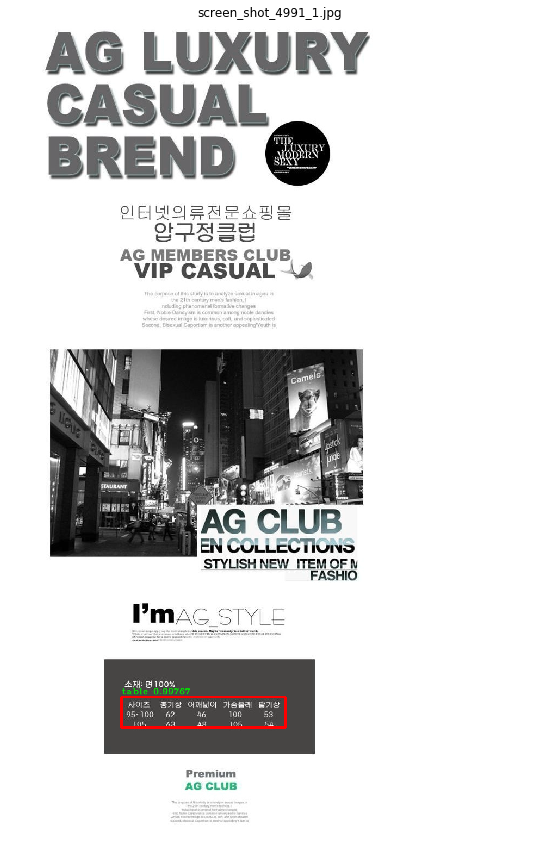

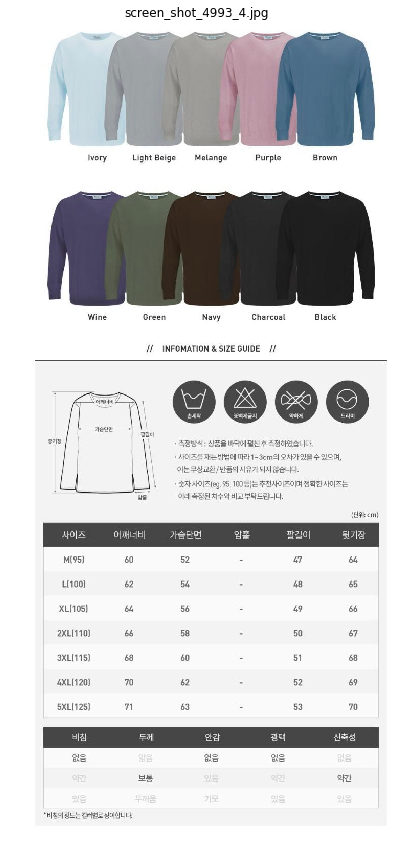

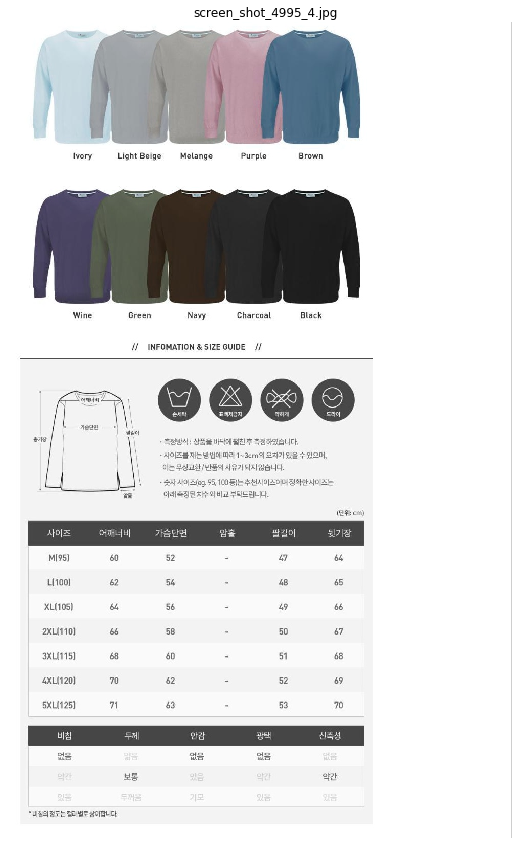

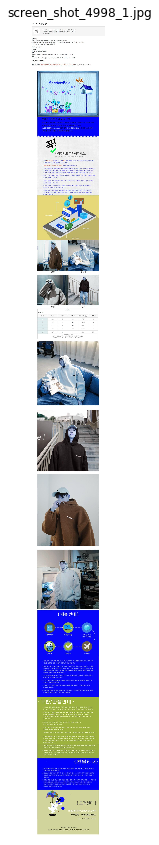

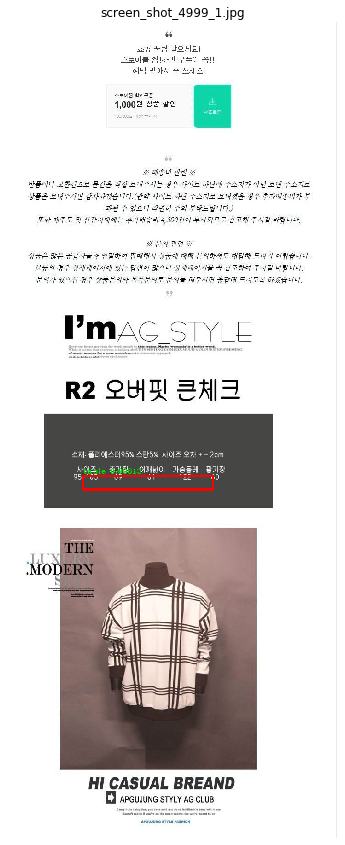

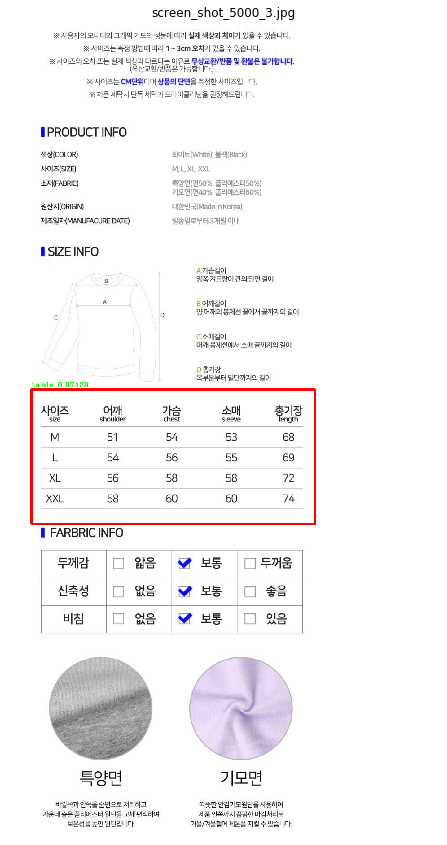

In [622]:
for img,idx in zip(predict_img, file_list):
    fig, axes = plt.subplots(1, 1, figsize=(15,15))
    plt.title(f'{idx}')
    cv2.imwrite(f'../data/output/output_{idx}', img)
    axes.imshow(img)
    axes.axis('off')

# YOLO + OpenCV

In [371]:
# test annotations
test_path = '../data/testset'
# total image
data_path = '../data/dataset'

test_size = 10
# test annotations으로 부터 test set .jpg로 파일 이름 변환
test_list = [f'{img[:-4]}.jpg' for img in os.listdir(test_path)]
test_list = test_list[:test_size]
image_path = f'{data_path}/{test_list[0]}'

In [242]:
image_path

'../data/dataset/screen_shot_4985_4.jpg'

In [295]:
original_img = cv2.imread(image_path)
predictions = tfnet.return_predict(original_img)

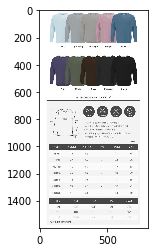

In [270]:
plt.imshow(original_img)

## YOLO근처의 이미지 잘라내기

In [762]:
def cv2_split(image_path, tfnet):
    original_img = cv2.imread(image_path)
    # YOLO 예측
    predictions = tfnet.return_predict(original_img)
    newImage = np.copy(original_img)
    
    # YOLO box list
    box_image = []
    # YOLO box를 포함하는 일정 영역 list
    cv_box_image = []
    for result in predictions:
        # YOLO detection
        top_x = result['topleft']['x']
        top_y = result['topleft']['y']
        btm_x = result['bottomright']['x']
        btm_y = result['bottomright']['y']
        # 특징 추출을 위한 범위를 설정
        # x축은 전체를 뽑아오고
        # y축은 위아래로 전체 이미지의 
        cv_top_x = 0
        cv_btm_x = newImage.shape[1]
#         y_len = (btm_y - top_y)
#         y_limit = newImage.shape[0]//4
#         # 예측되는 y의 길이가 전체 이미지 y축의 //4 보다 작으면  200을 위아래로 더해줌
#         if y_len < y_limit:
#             cv_top_y = max(top_y-y_limit, 0)
#             cv_btm_y = max(btm_y+y_limit, newImage.shape[0])
#         # 길면 그냥 y_len만큼 더해줌
#         else:
#             cv_top_y = max(top_y-y_len, 0)
#             cv_btm_y = max(btm_y+y_len, newImage.shape[1])
        cv_top_y = max(top_y-200, 0)
        cv_btm_y = max(btm_y+200, newImage.shape[1])

        confidence = result['confidence']
        # confidence는 클래스일 확률 
        label = result['label'] + " " + str(round(confidence, 5))
        
        if confidence > 0.3:
            print(f'top_y : {top_y} btm_y : {btm_y} top_x : {top_x} btm_x : {btm_x}')
            print(f'cv_top_y : {cv_top_y} cv_btm_y : {cv_btm_y} cv_top_x : {cv_top_x} cv_btm_x : {cv_btm_x}')
            box_image.append(original_img[top_y:btm_y, top_x:btm_x])
            cv_box_image.append(original_img[cv_top_y:cv_btm_y, cv_top_x:cv_btm_x])
    if len(box_image) == 0:
        print(f'YOLO가 못찾는 이미지 : {image_path}')
    else:
        
        
    # yolo box랑 cv box 리턴
    return box_image, cv_box_image

## IOU(Intersection Of Union)

In [763]:
_, cv_box_image = cv2_split(image_path, tfnet)

top_y : 980 btm_y : 1357 top_x : 37 btm_x : 742
cv_top_y : 780 cv_btm_y : 1557 cv_top_x : 0 cv_btm_x : 743


In [755]:
cv_box_image = cv_box_image[0]

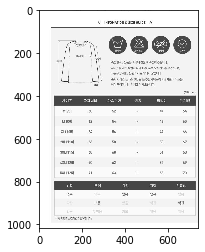

In [756]:
#fig, axes = plt.subplots(1, 1, figsize=(15,15))
plt.imshow(cv_box_image)

## 원본 이미지 -> 그레이 이미지

In [ ]:
x_path = '../data/testdata'
ximg_list = []
for file in os.listdir(x_path):
    ximg_list.append(f'{x_path}/{file}')

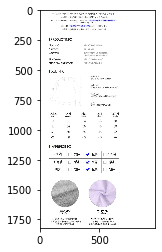

In [844]:
plt.imshow(cv2.imread(ximg_list[9]))

In [961]:
yolo_box, cv_box_image = cv2_split(ximg_list[28], tfnet)

top_y : 1705 btm_y : 1904 top_x : 123 btm_x : 655
cv_top_y : 1505 cv_btm_y : 2104 cv_top_x : 0 cv_btm_x : 784


In [962]:
cv_box_image = cv_box_image[0]
yolo_box = yolo_box[0]

In [963]:
original_img = cv_box_image

In [964]:
gray = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)

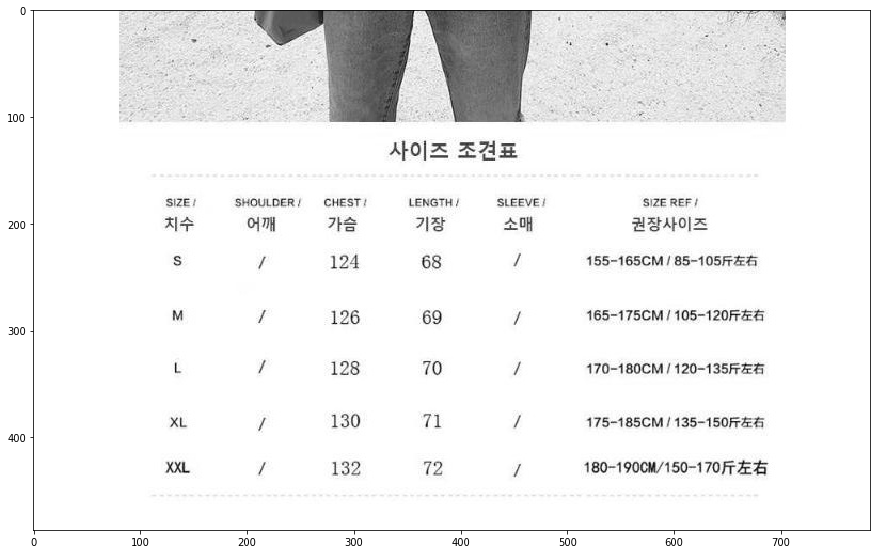

In [965]:
fig, axes = plt.subplots(1, 1, figsize=(15,15))
plt.imshow(gray, 'gray')

## blur를 한번 멕여줌
- 엣지를 검출하기전에 노이즈 제거위해

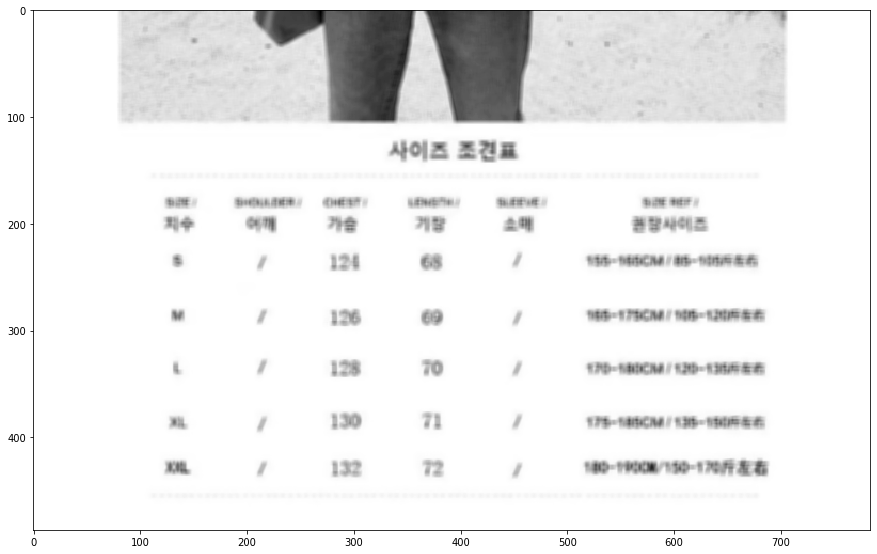

In [966]:
blur = cv2.blur(gray, (5,5))
fig, axes = plt.subplots(1, 1, figsize=(15,15))
plt.imshow(blur, 'gray')

## 엣지를 검출
- 상당히 작은 값의 임계치기준으로 면밀하게 다 뽑아오도록 함

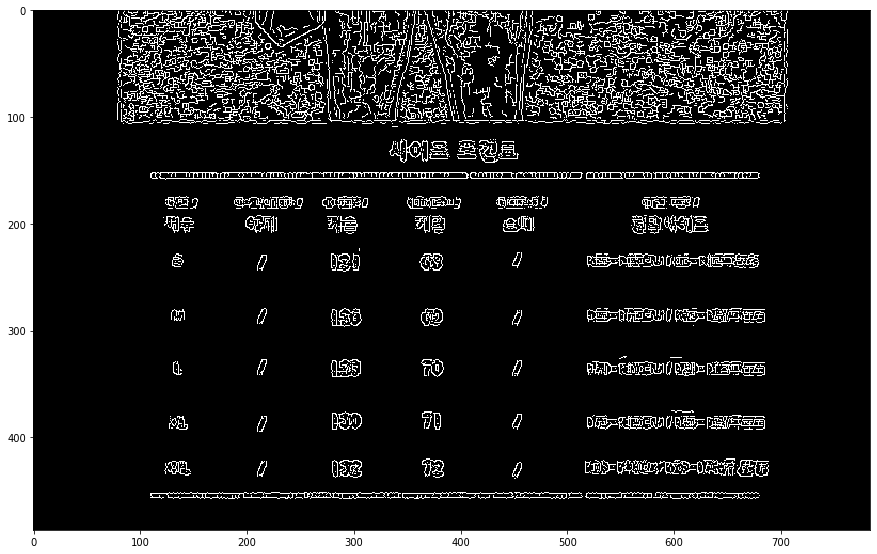

In [967]:
# Canny(입력이미지, 최소 임계치, 최대 임계치)
# 최소 임계치 < 보다 크고, 최대 임계치 보다 큰 값들 검출
canny_img = cv2.Canny(blur, 10,20)
fig, axes = plt.subplots(1, 1, figsize=(15,15))
plt.imshow(canny_img, 'gray')

## 뽑아온 이미지들에 대해서 morph통해 확장시켜줌

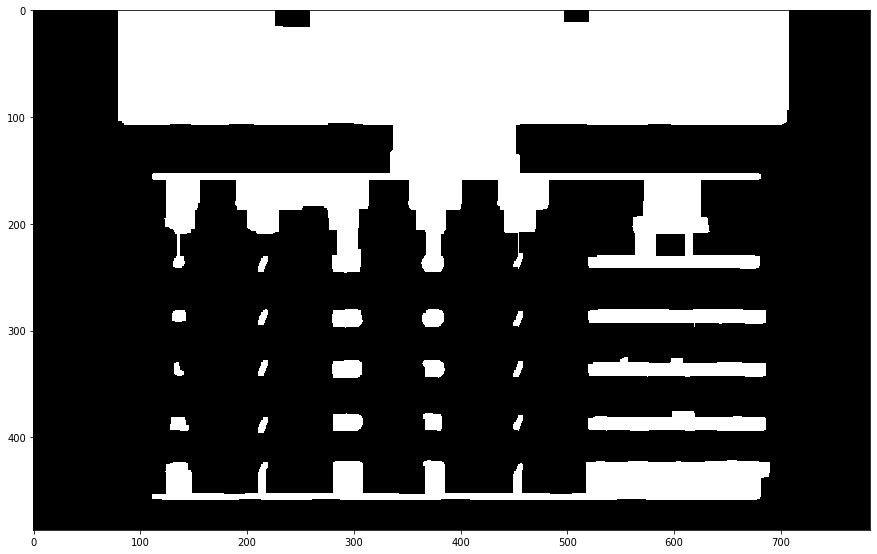

In [986]:
kernel = np.ones((20,20), np.uint8)
morph_gray = cv2.morphologyEx(canny_img, cv2.MORPH_CLOSE, kernel)
fig, axes = plt.subplots(1, 1, figsize=(15,15))
plt.imshow(morph_gray, 'gray')

In [987]:
contours,hierachy=cv2.findContours(morph_gray,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

In [988]:
%%time
original_img = cv_box_image.copy()
print(len(contours))
cnt_img = original_img
for i in range(0,len(contours)):
    cnt = contours[i]
    x,y,w,h = cv2.boundingRect(cnt)
    # 전체 이미지의 1/4보다 크고 yolo box의 절반 크기보다 커야함
    if w > original_img.shape[1]//4 and h > yolo_box.shape[0]//2:
        cnt_img = cv2.rectangle(original_img,(x,y),(x+w,y+h),(0,0,255),2)

22
Wall time: 1e+03 µs


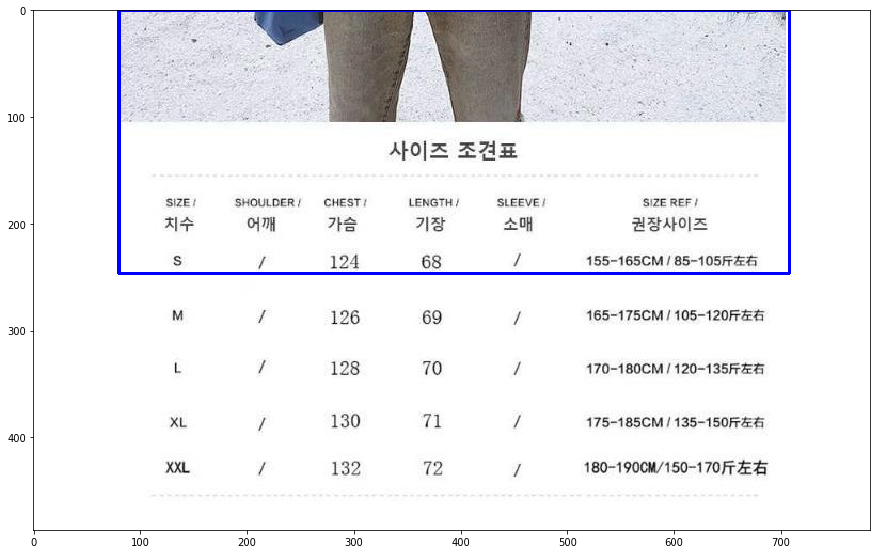

In [989]:
fig, axes = plt.subplots(1, 1, figsize=(15,15))
plt.imshow(cnt_img)

[{'label': 'table', 'confidence': 0.34377632, 'topleft': {'x': 123, 'y': 1705}, 'bottomright': {'x': 655, 'y': 1904}}]


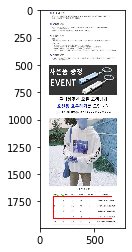

In [977]:
plt.imshow(yolo_predict(tfnet, ximg_list[28]))

## 위의 모든 것들을 작동시키는 함수

In [897]:
# 원본 이미지 path, 
def table_detection(img_path, tfnet):
    # yolo의 box이미지와, 적당히 위아래로 늘린 이미지 리스트를 리턴
    yolo_box, original_img = cv2_split(img_path, tfnet)
    # yolo가 테이블 못찾으면 split도 못하게 되어있음
    if len(original_img) == 0:
        img_ = cv2.imread('../data/not_found.jpg')
        return img_
    yolo_box = yolo_box[0]
    original_img = original_img[0]
    gray = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)
    blur = cv2.blur(gray, (5,5))
    canny_img = cv2.Canny(blur, 10,20)
    kernel = np.ones((20,20), np.uint8)
    morph_gray = cv2.morphologyEx(canny_img, cv2.MORPH_CLOSE, kernel)
    # 컨투어 인자 설정 링크 : https://datascienceschool.net/view-notebook/f9f8983941254a34bf0fee42c66c5539/
    # 모든 컨투어라인을 찾고 상하구조는 2단계, 그릴수있는 컨투어만 찾음
    contours, _ = cv2.findContours(morph_gray,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    
    cnt_img = yolo_box
    for i in range(0,len(contours)):
        cnt = contours[i]
        x,y,w,h = cv2.boundingRect(cnt)
        # 전체 이미지의 1/4보다 크고 yolo사이즈표의 1/2보다 커야함
        if w > original_img.shape[1]//4 and h > yolo_box.shape[0]//2:
            cnt_img = cv2.rectangle(original_img,(x,y),(x+w,y+h),(0,0,255),2)
    return cnt_img

top_y : 820 btm_y : 1119 top_x : 54 btm_x : 686
cv_top_y : 620 cv_btm_y : 1319 cv_top_x : 0 cv_btm_x : 967


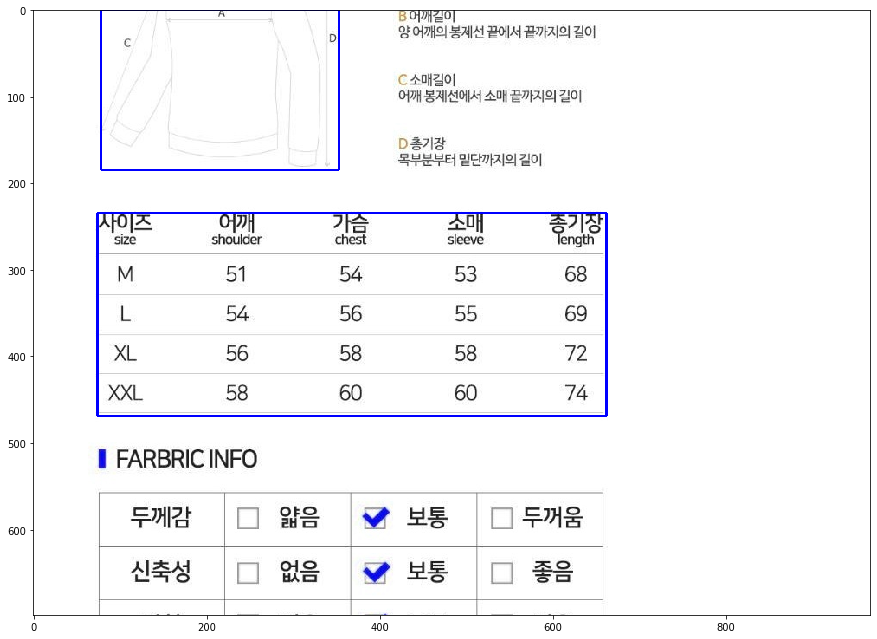

In [898]:
fig, axes = plt.subplots(1, 1, figsize=(15,15))
plt.imshow(table_detection(ximg_list[9], tfnet))

In [903]:
root_path = '../data/testdata' 
img_list = os.listdir(root_path)
cnt_list = []
for idx, path_ in enumerate(img_list[:50]):
    if idx % 5 == 0:
        print(f'{idx}...')
    img_path = f'{root_path}/{path_}'
    cnt_list.append(table_detection(img_path, tfnet))

0...
top_y : 881 btm_y : 1462 top_x : 0 btm_x : 798
cv_top_y : 681 cv_btm_y : 1662 cv_top_x : 0 cv_btm_x : 799
top_y : 2357 btm_y : 2424 top_x : 77 btm_x : 720
cv_top_y : 2157 cv_btm_y : 2624 cv_top_x : 0 cv_btm_x : 799
top_y : 938 btm_y : 1019 top_x : 92 btm_x : 505
cv_top_y : 738 cv_btm_y : 1219 cv_top_x : 0 cv_btm_x : 912
top_y : 1349 btm_y : 1382 top_x : 63 btm_x : 660
cv_top_y : 1149 cv_btm_y : 1582 cv_top_x : 0 cv_btm_x : 967
top_y : 1241 btm_y : 1297 top_x : 210 btm_x : 512
cv_top_y : 1041 cv_btm_y : 1497 cv_top_x : 0 cv_btm_x : 967
5...
top_y : 980 btm_y : 1357 top_x : 37 btm_x : 742
cv_top_y : 780 cv_btm_y : 1557 cv_top_x : 0 cv_btm_x : 743
top_y : 806 btm_y : 1520 top_x : 0 btm_x : 770
cv_top_y : 606 cv_btm_y : 1720 cv_top_x : 0 cv_btm_x : 1011
top_y : 2973 btm_y : 3141 top_x : 39 btm_x : 693
cv_top_y : 2773 cv_btm_y : 3341 cv_top_x : 0 cv_btm_x : 967
top_y : 985 btm_y : 1015 top_x : 165 btm_x : 448
cv_top_y : 785 cv_btm_y : 1215 cv_top_x : 0 cv_btm_x : 719
top_y : 820 btm_y 

C:\ProgramData\Anaconda3\envs\tmh_env\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


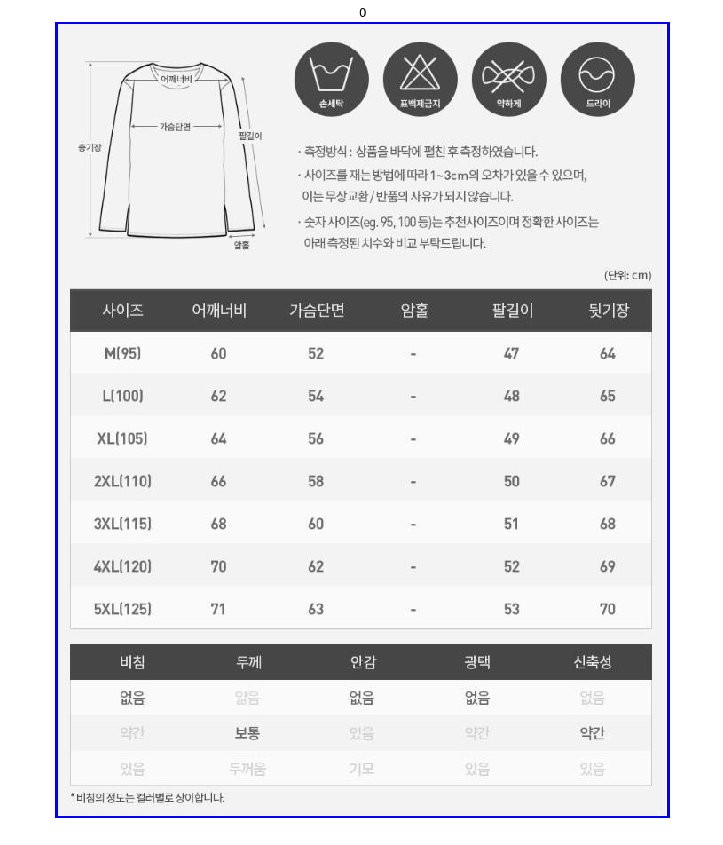

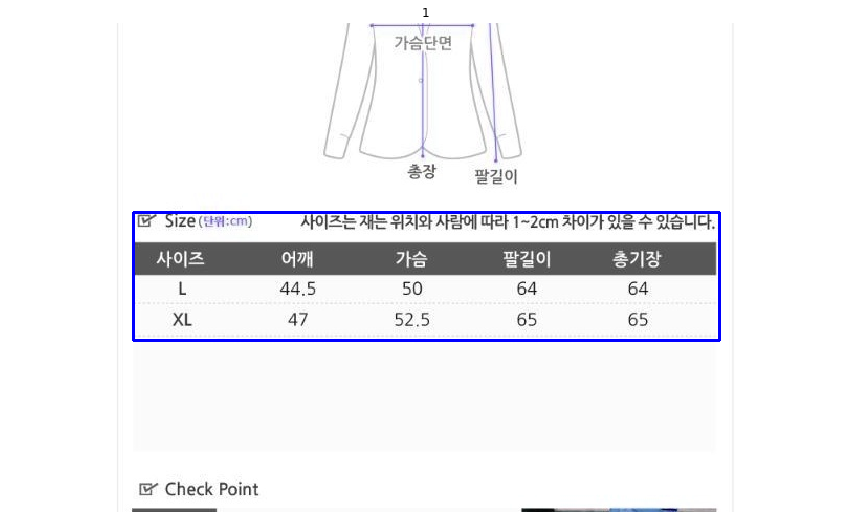

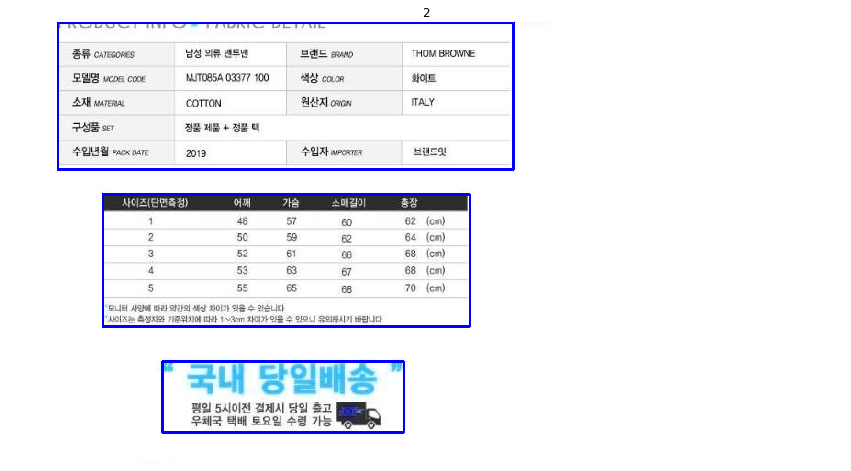

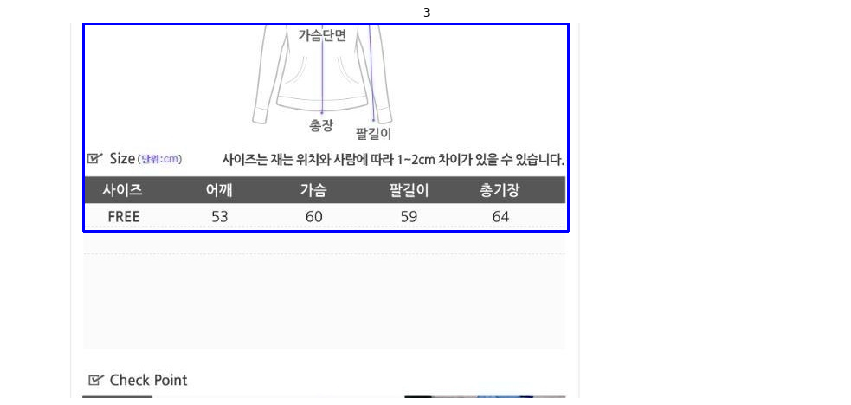

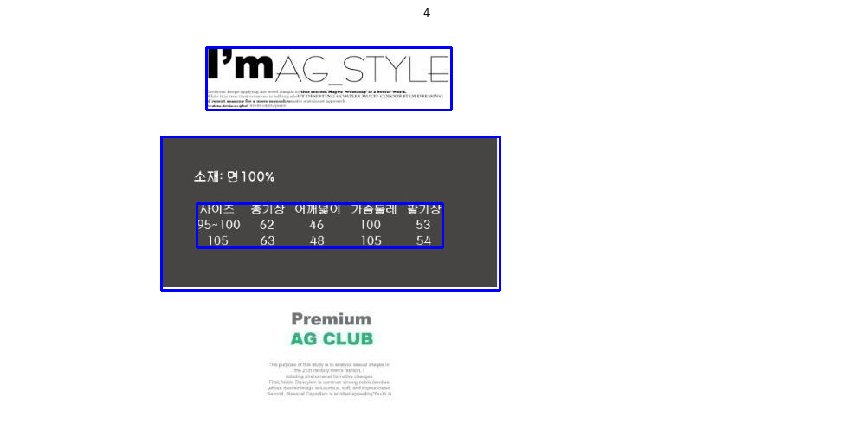

...

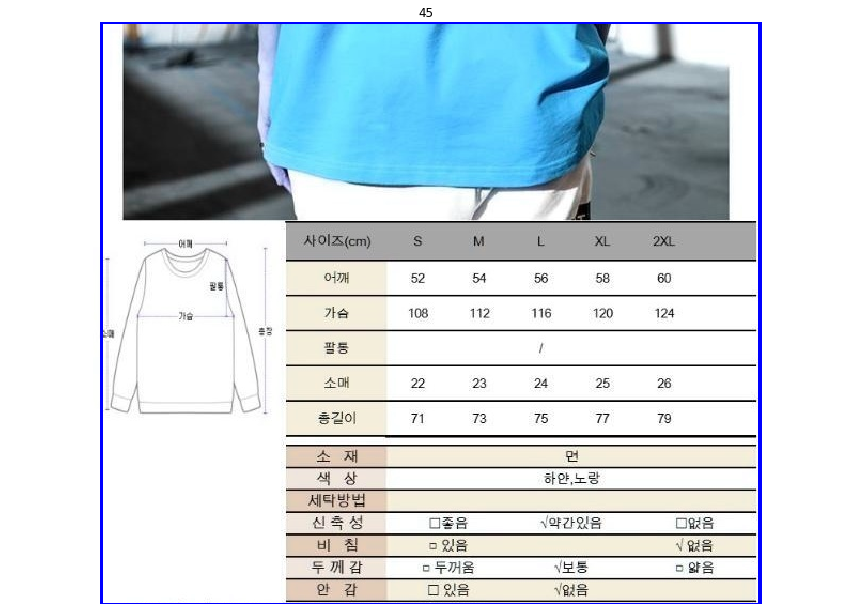

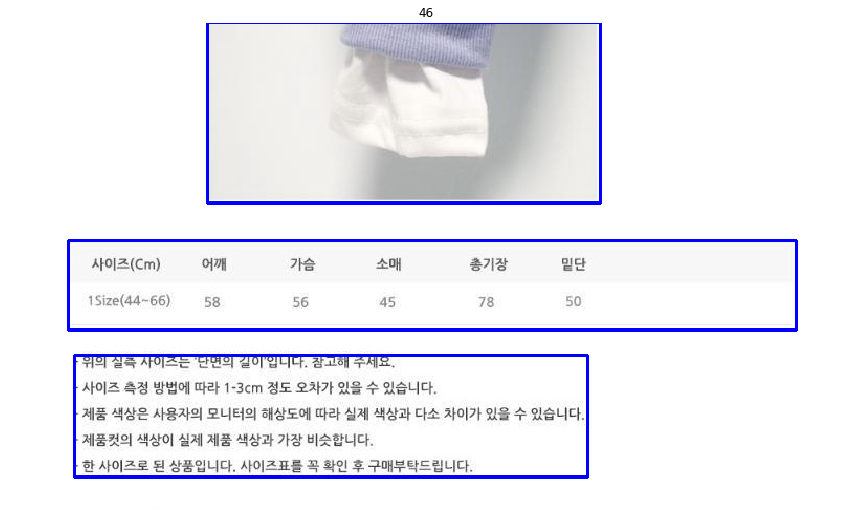

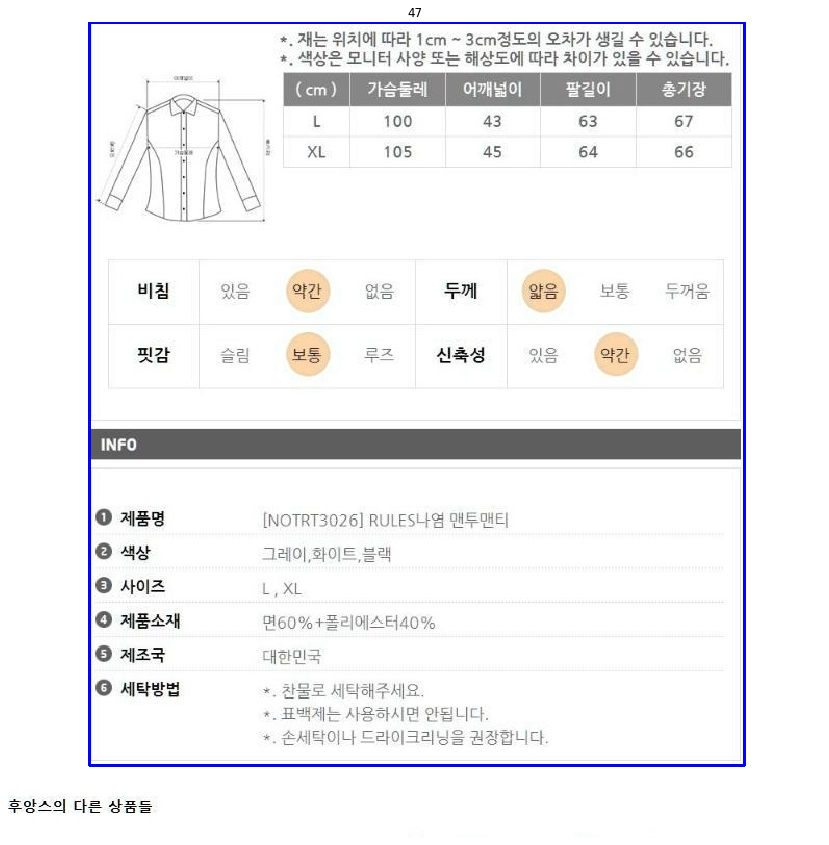

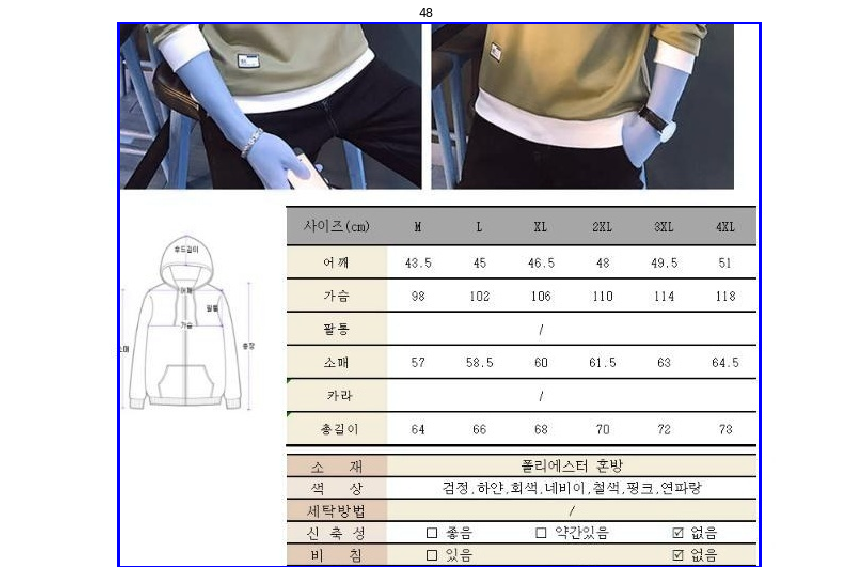

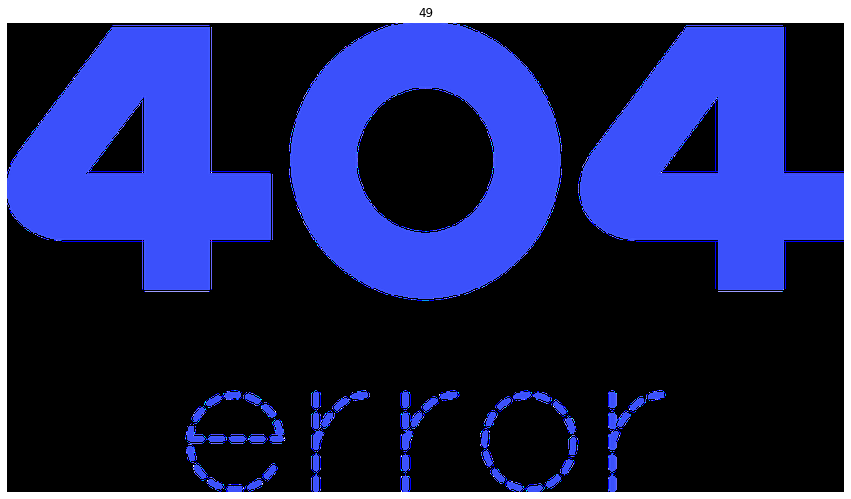

In [904]:
for idx, img in enumerate(cnt_list):
    fig, axes = plt.subplots(1, 1, figsize=(15,15))
    plt.title(f'{idx}')
    axes.imshow(img)
    axes.axis('off')

In [521]:
# test annotations
test_path = '../data/testset'
# total image
data_path = '../data/dataset'

test_size = 10
# test annotations으로 부터 test set .jpg로 파일 이름 변환
test_list = [f'{img[:-4]}.jpg' for img in os.listdir(test_path)]
len(test_list)

666

In [ ]:
for img_ in test_list:
    f'{data_path}/{img_}'

In [ ]:
for img,idx in zip(predict_img, file_list):
    fig, axes = plt.subplots(1, 1, figsize=(15,15))
    plt.title(f'{idx}')
    cv2.imwrite(f'../data/output/output_{idx}', img)
    axes.imshow(img)
    axes.axis('off')

In [ ]:
image_path = f'{data_path}/{test_list[0]}'

In [ ]:
for img,idx in zip(predict_img, file_list):
    fig, axes = plt.subplots(1, 1, figsize=(15,15))
    plt.title(f'{idx}')
    cv2.imwrite(f'../data/output/output_{idx}', img)
    axes.imshow(img)
    axes.axis('off')

# YOLO + OpenCV

## model laod

In [2]:
%matplotlib inline
## path 바꾸기 -> 한번만 실행
import os
import matplotlib.pyplot as plt
import numpy as np
from darkflow.net.build import TFNet
import cv2
print (os.getcwd()) #현재 디렉토리
darkflow_path = os.path.join(os.getcwd(), 'darkflow')
#디렉토리를 darkflow 안으로 바꿔줌
os.chdir(darkflow_path)
print (os.getcwd())

c:\OCR-SizeTable\OCR_test
c:\OCR-SizeTable\OCR_test\darkflow


In [3]:
load_weight = 22000
def load_yolo(load_weight):
    # model은 사용하는 cfg model
    options = {"model" : "cfg/size-yolo.cfg",
               "load" : load_weight} # 최신 checkpoint를 load하려면 -1
    tfnet = TFNet(options)
    tfnet.load_from_ckpt()
    return tfnet
tfnet = load_yolo(load_weight)

Parsing cfg/size-yolo.cfg
Loading None ...
Finished in 0.0s

Building net ...
Source | Train? | Layer description                | Output size
-------+--------+----------------------------------+---------------
Instructions for updating:
Colocations handled automatically by placer.
       |        | input                            | (?, 608, 608, 3)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 608, 608, 32)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 304, 304, 32)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 304, 304, 64)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 152, 152, 64)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 152, 152, 128)
 Init  |  Yep!  | conv 1x1p0_1  +bnorm  leaky      | (?, 152, 152, 64)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 152, 152, 128)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 76, 76, 128)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 76, 76, 256)
 Init  |

## testdata load

In [4]:
x_path = '../data/testdata'
ximg_list = []
for file in os.listdir(x_path):
    ximg_list.append(f'{x_path}/{file}')

In [101]:
# yolo로 뽑은box에 대한 정보를 관리하는 클래스
class yolo_box_info:
    # 원본이미지, YOLO로 예측된 박스정보를 저장하는 class
    def __init__(self, img, top_x, top_y, btm_x, btm_y):
        # 오리지널 이미지와
        self.origin_img = img
        # yolo box에 대한 좌표정보가 들어감
        self.top_x = top_x
        self.top_y = top_y
        self.btm_x = btm_x
        self.btm_y = btm_y
        self.height = self.btm_y - self.top_y
        self.width = self.btm_x - self.top_x

    def return_box(self):
        return self.origin_img[self.top_y:self.btm_y, self.top_x:self.btm_x]
        
    def __str__(self):
        print_str = f'top_x : {self.top_x} top_y : {self.top_y} btm_x : {self.btm_x} btm_y : {self.btm_y} ' 
        print_str2 = f'height : {self.height} width : {self.width} '
        
        return print_str+print_str2

    
# yolo box + 위아래 200에 대한 정보를 관리하는 클래스
class cv_box_info():
    def __init__(self, yolo_box,img, top_x, top_y, btm_x, btm_y):
        self.yolo_box = yolo_box
        self.origin_img = img
        self.top_x = top_x
        self.top_y = top_y
        self.btm_x = btm_x
        self.btm_y = btm_y
        self.height = self.btm_y - self.top_y
        self.width = self.btm_x - self.top_x
    
    def return_box(self):
        return self.yolo_box.origin_img[self.top_y:self.btm_y, self.top_x:self.btm_x]
    
    def __str__(self):
        print_str = f'top_x : {self.top_x} top_y : {self.top_y} btm_x : {self.btm_x} btm_y : {self.btm_y} ' 
        print_str2 = f'height : {self.height} width : {self.width} '
        
        return print_str+ print_str2



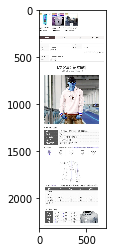

In [222]:
plt.imshow(cv2.imread(ximg_list[11]))

In [271]:
#def boxing(original_img , predictions):
original_img = cv2.imread(ximg_list[10])
predictions = tfnet.return_predict(original_img)
newImage = np.copy(original_img)
yolo_box_list = []

for result in predictions:
    top_x = result['topleft']['x']
    top_y = result['topleft']['y']
    btm_x = result['bottomright']['x']
    btm_y = result['bottomright']['y']

    confidence = result['confidence']
    # confidence는 클래스일 확률 
    label = result['label'] + " " + str(round(confidence, 5))
    box_image = newImage
    if confidence > 0.3:
        box_image = original_img[top_y:btm_y, top_x:btm_x]
        yolo_box = yolo_box_info(original_img, top_x, top_y, btm_x, btm_y)
        print(yolo_box)
        yolo_box_list.append(yolo_box)
        newImage = cv2.rectangle(newImage, (top_x, top_y), (btm_x, btm_y), (255,0,0), 3)
        newImage = cv2.putText(newImage, label, (top_x, top_y-5), cv2.FONT_HERSHEY_COMPLEX_SMALL , 0.8, (0, 230, 0), 1, cv2.LINE_AA)

#return newImage, box_image

top_x : 161 top_y : 455 btm_x : 696 btm_y : 799 height : 344 width : 535 
top_x : 178 top_y : 720 btm_x : 682 btm_y : 1061 height : 341 width : 504 
top_x : 136 top_y : 993 btm_x : 723 btm_y : 1274 height : 281 width : 587 


## 일단 그냥 각 box에 대해 위아래 150씩 더해서 새로운 영역 만들어줌
- boxinfo class 리스트를 만들어서 관리하는데
    - yolo box부분의 이미지, 그리고 각 좌표의 위치값들을 저장

In [272]:
cv_box_list = []
for yolo_box in yolo_box_list:
    cv_top_x = 0
    cv_btm_x = yolo_box.origin_img.shape[1]
    cv_top_y = max(yolo_box.top_y-150, 0)
    cv_btm_y = max(yolo_box.btm_y+150, yolo_box.origin_img.shape[1])
    # yolo box로 부터 위아래 200씩 준 이미지
    box_image = yolo_box.origin_img[cv_top_y:cv_btm_y, cv_top_x:cv_btm_x]
    cv_box = cv_box_info(yolo_box, box_image, cv_top_x, cv_top_y, cv_btm_x, cv_btm_y)
    print(cv_box)
    cv_box_list.append(cv_box)

top_x : 0 top_y : 255 btm_x : 967 btm_y : 999 height : 744 width : 967 
top_x : 0 top_y : 520 btm_x : 967 btm_y : 1261 height : 741 width : 967 
top_x : 0 top_y : 793 btm_x : 967 btm_y : 1474 height : 681 width : 967 


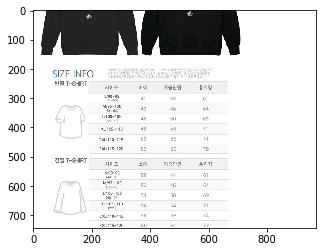

In [273]:
plt.imshow(cv_box_list[0].origin_img)

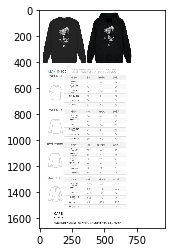

In [274]:
plt.imshow(cv_box_list[0].yolo_box.origin_img)

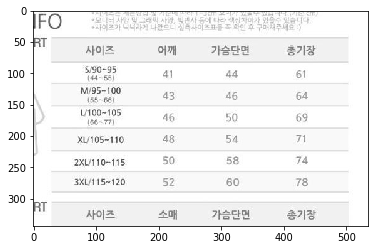

In [275]:
plt.imshow(cv_box_list[0].yolo_box.return_box())

## 각 box영역에 대해 contour를 뽑음

In [283]:
class cnt_img_info:
    def __init__(self, img, y, y_h):
        self.img = img
        self.y = y
        self.y_h = y_h

In [276]:
def get_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    iou = interArea / float(boxAArea + boxBArea - interArea)
    
    return iou

In [311]:
# 전체 검출되는 사이즈 테이블
cnt_list = []

if len(cv_box_list) == 0:
    print('failed detection')
else : 
    for cv_box in cv_box_list:
        # yolo box에서 위아래로 200씩 더한 이미지
        split_img = cv_box.return_box()
        draw_rect_img = split_img.copy()
        # 이미지에서의 yolo box
        yolo_box = cv_box.yolo_box.return_box()
        
        gray = cv2.cvtColor(split_img, cv2.COLOR_BGR2GRAY)
        blur = cv2.blur(gray, (5,5))
        canny_img = cv2.Canny(blur, 10,20)
        kernel = np.ones((20,20), np.uint8)
        morph_gray = cv2.morphologyEx(canny_img, cv2.MORPH_CLOSE, kernel)
        # 컨투어 인자 설정 링크 : https://datascienceschool.net/view-notebook/f9f8983941254a34bf0fee42c66c5539/
        # 모든 컨투어라인을 찾고 상하구조는 2단계, 그릴수있는 컨투어만 찾음
        contours, _ = cv2.findContours(morph_gray,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
        cnt_img = []
        cnt_idx = -1
        check_iou = []
        draw_img = yolo_box
        # 여기서 각 split된 이미지에 대해 contour를 뽑는데
        # 뽑게되는 좌표값이 split된 이미지에 대해 상대적인 값을 갖게된다
        # 때문에 절대적인 좌표, 즉 원본의 이미지에 대한 좌표값을 참조하기 위해서는
        # y좌표에 이전에 잘려나간 윗부분의 좌표값들을 더해주도록한다
        for i in range(0,len(contours)):
            cnt = contours[i]
            x,y,w,h = cv2.boundingRect(cnt)
            # 전체 이미지의 1/4보다 크고 yolo사이즈표의 1/2보다 커야함
            if w > split_img.shape[1]//4 and h > yolo_box.shape[0]//2:
                # 오리지널 이미지에 대한 절대좌표 y를 가지고 옴
                abs_y = y+cv_box.top_y
                print(x,abs_y,x+w,abs_y+h)
                
                # contour 이미지를 list에 더함
                # 클래스 형태로 저장(이미지, 절대 좌표y를 갖게)
                cnt_img.append(cnt_img_info(split_img[y:y+h, x:x+w], abs_y, abs_y+h ))
                cnt_idx += 1
                
                draw_img = cv2.rectangle(draw_rect_img,(x,y),(x+w,y+h),(0,0,255),2)
                # 위에서 언급한 절대적인 좌표가 필요한 이유는 yolo box와 contour box의 IOU를 구하기 위함
                print(cv_box.yolo_box)
                
                # yolo box
                boxA = [cv_box.yolo_box.top_x, cv_box.yolo_box.top_y, cv_box.yolo_box.btm_x, cv_box.yolo_box.btm_y]
                # contour box
                boxB = [x,abs_y,x+w,abs_y+h]
                # top_x, top_y, btm_x, btm_y
                box_iou = get_iou(boxA, boxB)
                print(f'box iou : {box_iou}')
                if box_iou > 0.1:
                    check_iou.append(cnt_idx)
        # 만약에 0.1이상 일치하는 컨투어 없으면 그냥 split이미지 리턴
        if len(check_iou) == 0:
            cnt_list.append(cnt_img_info(split_img, cv_box.top_y, cv_box.btm_y))
        # 0.1이상 일치하는 컨투어 있으면 그 중 가장 큰 것을 리턴
        else:
            area_list = []
            for idx in check_iou:
                cnt_area = cnt_img[idx].img.shape[0]*cnt_img[idx].img.shape[1], area_max
                area_list.append(cnt_area)
                print(f'cnt_area : {cnt_img[idx].img.shape[0]*cnt_img[idx].img.shape[1]}')
            max_idx = np.array(area_list).argmax()
            cnt_list.append(cnt_img[check_iou[max_idx]])
    # 겹치는 영역 있으면 그냥 합쳐서 출력하도록 함
    # 나오는 테이블이 하나 이상일때
#     if len(cnt_list) > 1:
#         next_y = cnt_list[0].y_h
#         for idx in range(1, len(cnt_list)):
#             if cnt_list[idx].y < next_y:

68 453 668 999
top_x : 161 top_y : 455 btm_x : 696 btm_y : 799 height : 344 width : 535 
box iou : 0.5178970884172017
cnt_area : 327600
59 520 668 1261
top_x : 178 top_y : 720 btm_x : 682 btm_y : 1061 height : 341 width : 504 
box iou : 0.36711644746047295
cnt_area : 451269
59 793 670 1474
top_x : 136 top_y : 993 btm_x : 723 btm_y : 1274 height : 281 width : 587 
box iou : 0.34896953715911455
cnt_area : 416091


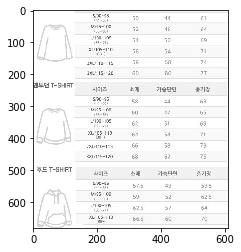

In [317]:
plt.imshow(cnt_list[2].img)

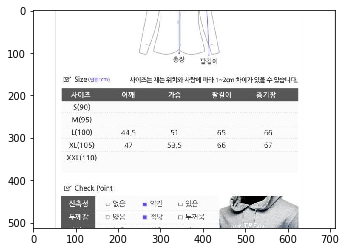

In [243]:
plt.imshow(cv_box_list[0].return_box())

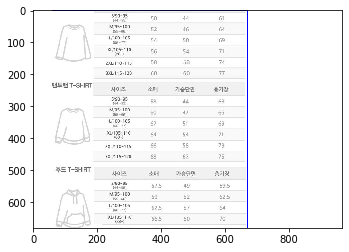

In [318]:
plt.imshow(draw_img)

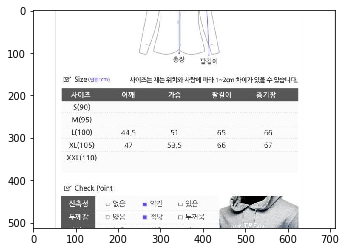

In [245]:
plt.imshow(split_img)

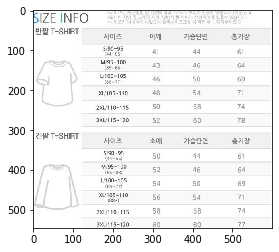

In [169]:
plt.imshow(test_list[0])

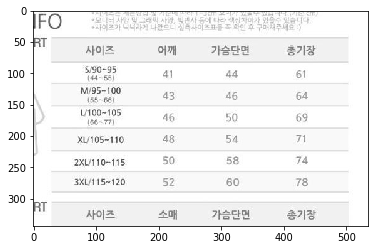

In [147]:
plt.imshow(cv_box_list[0].yolo_box.return_box())

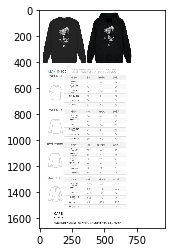

In [143]:
plt.imshow(cv_box_list[0].yolo_box.origin_img)

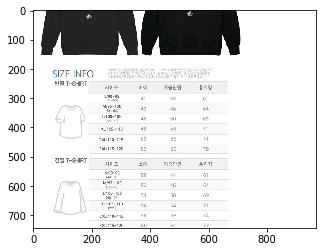

In [144]:
plt.imshow(cv_box_list[0].origin_img)

In [100]:
cv_box_list[0]

In [ ]:
# 원본 이미지 path, 
#def table_detection(img_path, tfnet):
# yolo의 box이미지와, 적당히 위아래로 늘린 이미지 리스트를 리턴
yolo_box, original_img = cv2_split(img_path, tfnet)
# yolo가 테이블 못찾으면 split도 못하게 되어있음
if len(original_img) == 0:
    img_ = cv2.imread('../data/not_found.jpg')
    return img_
yolo_box = yolo_box[0]
original_img = original_img[0]
gray = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)
blur = cv2.blur(gray, (5,5))
canny_img = cv2.Canny(blur, 10,20)
kernel = np.ones((20,20), np.uint8)
morph_gray = cv2.morphologyEx(canny_img, cv2.MORPH_CLOSE, kernel)
# 컨투어 인자 설정 링크 : https://datascienceschool.net/view-notebook/f9f8983941254a34bf0fee42c66c5539/
# 모든 컨투어라인을 찾고 상하구조는 2단계, 그릴수있는 컨투어만 찾음
contours, _ = cv2.findContours(morph_gray,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

cnt_img = yolo_box
for i in range(0,len(contours)):
    cnt = contours[i]
    x,y,w,h = cv2.boundingRect(cnt)
    # 전체 이미지의 1/4보다 크고 yolo사이즈표의 1/2보다 커야함
    if w > original_img.shape[1]//4 and h > yolo_box.shape[0]//2:
        cnt_img = cv2.rectangle(original_img,(x,y),(x+w,y+h),(0,0,255),2)
#return cnt_img

In [1093]:
btm_y = 0
for idx, yolo_box in enumerate(yolobox_class):
    if idx == 0:
        # 절대 참조될 수 없는 최대 값을 넣어주고
        btm_y = yolo_box.origin_img.shape[1]+100
    # 이전의 박스 btm_y보다 작다는건 이전의 박스와 곂치게 yolo detection이 된거임
    # 여기서 그냥 두 박스를 합쳐주도록 함
    if yolo_box.btm_y < btm_y:
        btm_y = yolo_box.btm_y
    else:
        
    
    cv_top_x = 0
    cv_btm_x = yolo_box.origin_img.shape[1]
    cv_top_y = max(top_y-200, 0)
    cv_btm_y = max(btm_y+200, newImage.shape[1])

top_x : 161 top_y : 455 btm_x : 696 btm_y : 799 height : 344 width : 535 
top_x : 178 top_y : 720 btm_x : 682 btm_y : 1061 height : 341 width : 504 
top_x : 136 top_y : 993 btm_x : 723 btm_y : 1274 height : 281 width : 587 


In [ ]:
#def cv2_split(image_path, tfnet):
original_img = cv2.imread(image_path)
# YOLO 예측
predictions = tfnet.return_predict(original_img)
newImage = np.copy(original_img)

# YOLO box list
box_image = []
# YOLO box를 포함하는 일정 영역 list
cv_box_image = []
for result in predictions:
    # YOLO detection
    top_x = result['topleft']['x']
    top_y = result['topleft']['y']
    btm_x = result['bottomright']['x']
    btm_y = result['bottomright']['y']
    # 특징 추출을 위한 범위를 설정
    # x축은 전체를 뽑아오고
    # y축은 위아래로 전체 이미지의 
    cv_top_x = 0
    cv_btm_x = newImage.shape[1]
    cv_top_y = max(top_y-200, 0)
    cv_btm_y = max(btm_y+200, newImage.shape[1])

    confidence = result['confidence']
    # confidence는 클래스일 확률 
    label = result['label'] + " " + str(round(confidence, 5))

    if confidence > 0.3:
        print(f'top_y : {top_y} btm_y : {btm_y} top_x : {top_x} btm_x : {btm_x}')
        print(f'cv_top_y : {cv_top_y} cv_btm_y : {cv_btm_y} cv_top_x : {cv_top_x} cv_btm_x : {cv_btm_x}')
        box_image.append(original_img[top_y:btm_y, top_x:btm_x])
        cv_box_image.append(original_img[cv_top_y:cv_btm_y, cv_top_x:cv_btm_x])
if len(box_image) == 0:
    print(f'YOLO가 못찾는 이미지 : {image_path}')
else:


# yolo box랑 cv box 리턴
#return box_image, cv_box_image

In [ ]:
# 원본 이미지 path, 
#def table_detection(img_path, tfnet):
# yolo의 box이미지와, 적당히 위아래로 늘린 이미지 리스트를 리턴
yolo_box, original_img = cv2_split(img_path, tfnet)
# yolo가 테이블 못찾으면 split도 못하게 되어있음
if len(original_img) == 0:
    img_ = cv2.imread('../data/not_found.jpg')
    return img_
yolo_box = yolo_box[0]
original_img = original_img[0]
gray = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)
blur = cv2.blur(gray, (5,5))
canny_img = cv2.Canny(blur, 10,20)
kernel = np.ones((20,20), np.uint8)
morph_gray = cv2.morphologyEx(canny_img, cv2.MORPH_CLOSE, kernel)
# 컨투어 인자 설정 링크 : https://datascienceschool.net/view-notebook/f9f8983941254a34bf0fee42c66c5539/
# 모든 컨투어라인을 찾고 상하구조는 2단계, 그릴수있는 컨투어만 찾음
contours, _ = cv2.findContours(morph_gray,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

cnt_img = yolo_boxb
for i in range(0,len(contours)):
    cnt = contours[i]
    x,y,w,h = cv2.boundingRect(cnt)
    # 전체 이미지의 1/4보다 크고 yolo사이즈표의 1/2보다 커야함
    if w > original_img.shape[1]//4 and h > yolo_box.shape[0]//2:
        cnt_img = cv2.rectangle(original_img,(x,y),(x+w,y+h),(0,0,255),2)
#return cnt_img

In [226]:
#def boxing(original_img , predictions):
original_img = cv2.imread(ximg_list[11])
predictions = tfnet.return_predict(original_img)
newImage = np.copy(original_img)
yolo_box_list = []

for result in predictions:
    top_x = result['topleft']['x']
    top_y = result['topleft']['y']
    btm_x = result['bottomright']['x']
    btm_y = result['bottomright']['y']

    confidence = result['confidence']
    # confidence는 클래스일 확률 
    label = result['label'] + " " + str(round(confidence, 5))
    box_image = newImage
    if confidence > 0.3:
        box_image = original_img[top_y:btm_y, top_x:btm_x]
        yolo_box = yolo_box_info(original_img, top_x, top_y, btm_x, btm_y)
        print(yolo_box)
        yolo_box_list.append(yolo_box)
        newImage = cv2.rectangle(newImage, (top_x, top_y), (btm_x, btm_y), (255,0,0), 3)
        newImage = cv2.putText(newImage, label, (top_x, top_y-5), cv2.FONT_HERSHEY_COMPLEX_SMALL , 0.8, (0, 230, 0), 1, cv2.LINE_AA)

#return newImage, box_image
cv_box_list = []
for yolo_box in yolo_box_list:
    cv_top_x = 0
    cv_btm_x = yolo_box.origin_img.shape[1]
    cv_top_y = max(yolo_box.top_y-200, 0)
    cv_btm_y = max(yolo_box.btm_y+200, yolo_box.origin_img.shape[1])
    # yolo box로 부터 위아래 200씩 준 이미지
    box_image = yolo_box.origin_img[cv_top_y:cv_btm_y, cv_top_x:cv_btm_x]
    cv_box = cv_box_info(yolo_box, box_image, cv_top_x, cv_top_y, cv_btm_x, cv_btm_y)
    print(cv_box)
    cv_box_list.append(cv_box)
    
test_list = []
cv_box = cv_box_list[0]

# yolo box에서 위아래로 200씩 더한 이미지
split_img = cv_box.return_box()

draw_rect_img = split_img.copy()
# 이미지에서의 yolo box
yolo_box = cv_box.yolo_box.return_box()

gray = cv2.cvtColor(split_img, cv2.COLOR_BGR2GRAY)
blur = cv2.blur(gray, (5,5))
canny_img = cv2.Canny(blur, 10,20)
kernel = np.ones((20,20), np.uint8)
morph_gray = cv2.morphologyEx(canny_img, cv2.MORPH_CLOSE, kernel)
# 컨투어 인자 설정 링크 : https://datascienceschool.net/view-notebook/f9f8983941254a34bf0fee42c66c5539/
# 모든 컨투어라인을 찾고 상하구조는 2단계, 그릴수있는 컨투어만 찾음
contours, _ = cv2.findContours(morph_gray,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cnt_img = yolo_box
draw_img = yolo_box
# 여기서 각 split된 이미지에 대해 contour를 뽑는데
# 뽑게되는 좌표값이 split된 이미지에 대해 상대적인 값을 갖게된다
# 때문에 절대적인 좌표, 즉 원본의 이미지에 대한 좌표값을 참조하기 위해서는
# y좌표에 이전에 잘려나간 윗부분의 좌표값들을 더해주도록한다
for i in range(0,len(contours)):
    cnt = contours[i]
    x,y,w,h = cv2.boundingRect(cnt)
    # 전체 이미지의 1/4보다 크고 yolo사이즈표의 1/2보다 커야함
    if w > split_img.shape[1]//4 and h > yolo_box.shape[0]//2:
        test_list.append(split_img[y:y+h, x:x+w])
        draw_img = cv2.rectangle(draw_rect_img,(x,y),(x+w,y+h),(0,0,255),2)
        # 위에서 언급한 절대적인 좌표가 필요한 이유는 yolo box와 contour box의 IOU를 구하기 위함
        print(cv_box.yolo_box)
        y = y+cv_box.top_y
        print(x,y,x+w,y+h)
        # yolo box
        boxA = [cv_box.yolo_box.top_x, cv_box.yolo_box.top_y, cv_box.yolo_box.btm_x, cv_box.yolo_box.btm_y]
        # contour box
        boxB = [x,y,x+w,y+h]
        # top_x, top_y, btm_x, btm_y
        print(get_iou(boxA, boxB))



top_x : 17 top_y : 1900 btm_x : 683 btm_y : 2013 height : 113 width : 666 
top_x : 0 top_y : 1700 btm_x : 713 btm_y : 2213 height : 513 width : 713 
top_x : 17 top_y : 1900 btm_x : 683 btm_y : 2013 height : 113 width : 666 
248 1700 442 1832
0.0
top_x : 17 top_y : 1900 btm_x : 683 btm_y : 2013 height : 113 width : 666 
51 1700 627 2213
0.21437370860193328


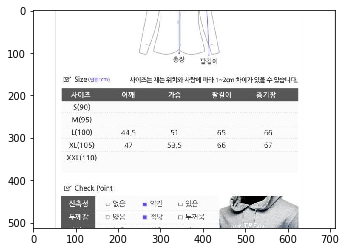

In [227]:
plt.imshow(split_img)

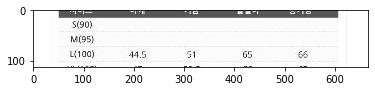

In [228]:
plt.imshow(yolo_box)

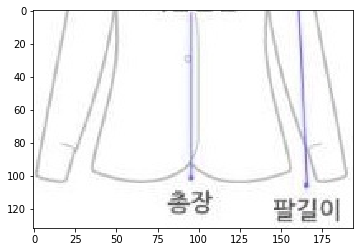

In [229]:
plt.imshow(test_list[0])

[{'label': 'table', 'confidence': 0.9379235, 'topleft': {'x': 17, 'y': 1900}, 'bottomright': {'x': 683, 'y': 2013}}]


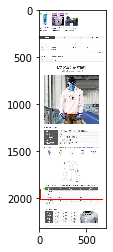

In [205]:
plt.imshow(yolo_predict(tfnet, ximg_list[11]))

In [206]:
img_ = yolo_predict(tfnet, ximg_list[11])

[{'label': 'table', 'confidence': 0.9379235, 'topleft': {'x': 17, 'y': 1900}, 'bottomright': {'x': 683, 'y': 2013}}]


In [207]:
cv2.imwrite('../test.jpg', img_)

True

## 위의 모든 것들을 작동시키는 함수
- 경로를 바꿔주고(darkflow에 맞게)
- 모델을 load하고
- yolo로뽑는 table, 확장된 영역의 이미지를 관리하는 클래스
- yolo table을 기준으로 확장된 영역 이미지 뽑는 함수
- Intersection over union 함수
- 컨투어 활용해서 적합한 테이블 찾는 함수

In [1]:
%matplotlib inline
## path 바꾸기 -> 한번만 실행
import os
import matplotlib.pyplot as plt
import numpy as np
from darkflow.net.build import TFNet
import cv2
print (os.getcwd()) #현재 디렉토리
darkflow_path = os.path.join(os.getcwd(), 'darkflow')
#디렉토리를 darkflow 안으로 바꿔줌
os.chdir(darkflow_path)
print (os.getcwd())

c:\OCR-SizeTable\OCR_test
c:\OCR-SizeTable\OCR_test\darkflow


In [2]:
def load_yolo(load_weight):
    # model은 사용하는 cfg model
    options = {"model" : "cfg/size-yolo.cfg",
               "load" : load_weight} # 최신 checkpoint를 load하려면 -1
    tfnet = TFNet(options)
    tfnet.load_from_ckpt()
    return tfnet

In [3]:
load_weight = 22000
tfnet = load_yolo(load_weight)

Parsing cfg/size-yolo.cfg
Loading None ...
Finished in 0.0s

Building net ...
Source | Train? | Layer description                | Output size
-------+--------+----------------------------------+---------------
Instructions for updating:
Colocations handled automatically by placer.
       |        | input                            | (?, 608, 608, 3)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 608, 608, 32)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 304, 304, 32)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 304, 304, 64)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 152, 152, 64)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 152, 152, 128)
 Init  |  Yep!  | conv 1x1p0_1  +bnorm  leaky      | (?, 152, 152, 64)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 152, 152, 128)
 Load  |  Yep!  | maxp 2x2p0_2                     | (?, 76, 76, 128)
 Init  |  Yep!  | conv 3x3p1_1  +bnorm  leaky      | (?, 76, 76, 256)
 Init  |

In [4]:
# yolo로 뽑은box에 대한 정보를 관리하는 클래스
class yolo_box_info:
    # 원본이미지, YOLO로 예측된 박스정보를 저장하는 class
    def __init__(self, img, top_x, top_y, btm_x, btm_y):
        # 오리지널 이미지와
        self.origin_img = img
        # yolo box에 대한 좌표정보가 들어감
        self.top_x = top_x
        self.top_y = top_y
        self.btm_x = btm_x
        self.btm_y = btm_y
        self.height = self.btm_y - self.top_y
        self.width = self.btm_x - self.top_x

    def return_box(self):
        return self.origin_img[self.top_y:self.btm_y, self.top_x:self.btm_x]
        
    def __str__(self):
        print_str = f'top_x : {self.top_x} top_y : {self.top_y} btm_x : {self.btm_x} btm_y : {self.btm_y} ' 
        print_str2 = f'height : {self.height} width : {self.width} '
        
        return print_str+print_str2

    
# yolo box + 위아래 200에 대한 정보를 관리하는 클래스
class cv_box_info():
    def __init__(self, yolo_box,img, top_x, top_y, btm_x, btm_y):
        self.yolo_box = yolo_box
        self.origin_img = img
        self.top_x = top_x
        self.top_y = top_y
        self.btm_x = btm_x
        self.btm_y = btm_y
        self.height = self.btm_y - self.top_y
        self.width = self.btm_x - self.top_x
    
    def return_box(self):
        return self.yolo_box.origin_img[self.top_y:self.btm_y, self.top_x:self.btm_x]
    
    def __str__(self):
        print_str = f'top_x : {self.top_x} top_y : {self.top_y} btm_x : {self.btm_x} btm_y : {self.btm_y} ' 
        print_str2 = f'height : {self.height} width : {self.width} '
        
        return print_str+ print_str2
    
# 컨투어 이미지 정보를 관리하는 클래스
class cnt_img_info:
    def __init__(self, img, y, y_h):
        self.img = img
        self.y = y
        self.y_h = y_h

In [5]:
default_img_path = '../data/not_found.jpg'
# yolo table을 기준으로 위아래 150으로 뽑아주는 함수
def yolo_split(original_img, tfnet):
    original_img = cv2.imread(original_img)
    # yolo box저장 list
    yolo_box_list = []
    # 위아래 150 추가한 이미지 저장 리스트
    cv_box_list = []
    predictions = tfnet.return_predict(original_img)
    # yolo로 예측하고 그 박스부분을 뽑는다
    try:
        for result in predictions:
            top_x = result['topleft']['x']
            top_y = result['topleft']['y']
            btm_x = result['bottomright']['x']
            btm_y = result['bottomright']['y']

            confidence = result['confidence']
            # confidence는 클래스일 확률 
            label = result['label'] + " " + str(round(confidence, 5))
            box_image = original_img
            if confidence > 0.3:
                box_image = original_img[top_y:btm_y, top_x:btm_x]
                yolo_box = yolo_box_info(original_img, top_x, top_y, btm_x, btm_y)
#                print(yolo_box)
                yolo_box_list.append(yolo_box)
    except:
        print("yolo predictions error !")
        pass
    # yolo가 못찾으면 그냥 default 이미지 리턴
    if len(yolo_box_list) == 0:
        print("empitied yolo_box_list !")
        return [cv2.imread(default_img_path)]
    try:
        # yolo box를 기준으로 위아래 150으로 이미지를 뽑는다
        for yolo_box in yolo_box_list:
            cv_top_x = 0
            cv_btm_x = yolo_box.origin_img.shape[1]
            cv_top_y = max(yolo_box.top_y-150, 0)
            cv_btm_y = max(yolo_box.btm_y+150, yolo_box.origin_img.shape[1])
            # yolo box로 부터 위아래 200씩 준 이미지
            box_image = yolo_box.origin_img[cv_top_y:cv_btm_y, cv_top_x:cv_btm_x]
            cv_box = cv_box_info(yolo_box, box_image, cv_top_x, cv_top_y, cv_btm_x, cv_btm_y)
#             print(cv_box)
            cv_box_list.append(cv_box)
    except:
        print('opencv split error!')
        pass
    # box class를 담고있는 리스트를 리턴
    return cv_box_list

In [7]:
x_path = '../data/testdata'
ximg_list = []
for file in os.listdir(x_path):
    ximg_list.append(f'{x_path}/{file}')

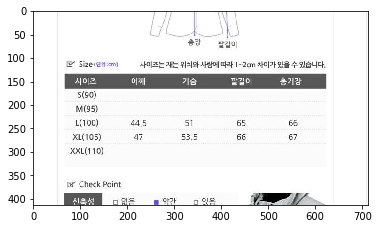

In [8]:
test_a = yolo_split(ximg_list[11], tfnet)
plt.imshow(test_a[0].return_box())

In [9]:
# 컨투어로 뽑은 영역과 YOLO 테이블의 영역의 intersection over union을 구하는 함수
def get_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    iou = interArea / float(boxAArea + boxBArea - interArea)
    
    return iou

In [30]:
# 컨투어 영역과 yolo테이블 비교해서 적합한 테이블 검출하는 함수
def find_table(cv_box_list):
    # 전체 검출되는 사이즈 테이블
    cnt_list = []

    if len(cv_box_list) == 0:
        print('failed detection')
    else : 
        for cv_box in cv_box_list:
            try:
                # yolo box에서 위아래로 200씩 더한 이미지
                split_img = cv_box.return_box()
                draw_rect_img = split_img.copy()
                # 이미지에서의 yolo box
                yolo_box = cv_box.yolo_box.return_box()

                gray = cv2.cvtColor(split_img, cv2.COLOR_BGR2GRAY)
                blur = cv2.blur(gray, (5,5))
                canny_img = cv2.Canny(blur, 10,20)
                kernel = np.ones((20,20), np.uint8)
                morph_gray = cv2.morphologyEx(canny_img, cv2.MORPH_CLOSE, kernel)
                # 컨투어 인자 설정 링크 : https://datascienceschool.net/view-notebook/f9f8983941254a34bf0fee42c66c5539/
                # 모든 컨투어라인을 찾고 상하구조는 2단계, 그릴수있는 컨투어만 찾음
                contours, _ = cv2.findContours(morph_gray,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
                cnt_img = []
                cnt_idx = -1
                check_iou = []
                draw_img = yolo_box
                # 여기서 각 split된 이미지에 대해 contour를 뽑는데
                # 뽑게되는 좌표값이 split된 이미지에 대해 상대적인 값을 갖게된다
                # 때문에 절대적인 좌표, 즉 원본의 이미지에 대한 좌표값을 참조하기 위해서는
                # y좌표에 이전에 잘려나간 윗부분의 좌표값들을 더해주도록한다
                for i in range(0,len(contours)):
                    cnt = contours[i]
                    x,y,w,h = cv2.boundingRect(cnt)
                    # 전체 이미지의 1/4보다 크고 yolo사이즈표의 1/2보다 커야함
                    if w > split_img.shape[1]//4 and h > yolo_box.shape[0]//2:
                        # 오리지널 이미지에 대한 절대좌표 y를 가지고 옴
                        abs_y = y+cv_box.top_y
#                         print(x,abs_y,x+w,abs_y+h)

                        # contour 이미지를 list에 더함
                        # 클래스 형태로 저장(이미지, 절대 좌표y를 갖게)
                        cnt_img.append(cnt_img_info(split_img[y:y+h, x:x+w], abs_y, abs_y+h ))
                        cnt_idx += 1

                        draw_img = cv2.rectangle(draw_rect_img,(x,y),(x+w,y+h),(0,0,255),2)
                        # 위에서 언급한 절대적인 좌표가 필요한 이유는 yolo box와 contour box의 IOU를 구하기 위함
#                         print(cv_box.yolo_box)

                        # yolo box
                        boxA = [cv_box.yolo_box.top_x, cv_box.yolo_box.top_y, cv_box.yolo_box.btm_x, cv_box.yolo_box.btm_y]
                        # contour box
                        boxB = [x,abs_y,x+w,abs_y+h]
                        # top_x, top_y, btm_x, btm_y
                        box_iou = get_iou(boxA, boxB)
#                         print(f'box iou : {box_iou}')
                        if box_iou > 0.1:
                            check_iou.append(cnt_idx)
                # 만약에 0.1이상 일치하는 컨투어 없으면 그냥 split이미지 리턴
                if len(check_iou) == 0:
                    cnt_list.append(cnt_img_info(split_img, cv_box.top_y, cv_box.btm_y))
                # 0.1이상 일치하는 컨투어 있으면 그 중 가장 큰 것을 리턴
                else:
                    area_list = []
                    for idx in check_iou:
                        cnt_area = cnt_img[idx].img.shape[0]*cnt_img[idx].img.shape[1]
                        area_list.append(cnt_area)
#                         print(f'cnt_area : {cnt_img[idx].img.shape[0]*cnt_img[idx].img.shape[1]}')
                    max_idx = np.array(area_list).argmax()
                    cnt_list.append(cnt_img[check_iou[max_idx]])
            except:
                print('erorr!')
                continue
    return cnt_list

box iou : 0.0
box iou : 0.26388252598075856


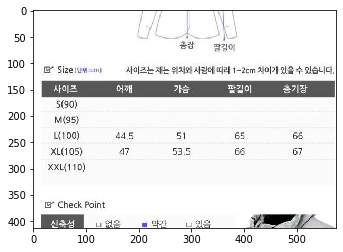

In [26]:
test_b = find_table(test_a)
plt.imshow(test_b[0].img)

## TEST

In [56]:
test_path = '../data/testdata'
test_path_list = []
for file in os.listdir(test_path):
    test_path_list.append(f'{test_path}/{file}')

In [65]:
split_img_list

In [64]:
test_ = test_path_list[10]
split_img_list = yolo_split(test_, tfnet)
for split_img in split_img_list:
    print(split_img.yolo_box.return_box())


[[[255 255 255]
  [255 255 255]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[245 245 245]
  [254 254 254]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[246 246 246]
  [250 250 250]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
[[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ..

In [53]:
table_list = []
yolo_table_list = []
test_path_list = test_path_list[10:12]
for test_ in test_path_list:
    split_img_list = yolo_split(test_, tfnet)
    for split_img in split_img_list:
        print(split_img.yolo_box.return_box())
        
    

In [49]:
split_img

In [ ]:
yolo_table_list.append(split_img.)
    table = find_table(split_img)
    table_list.append(table)

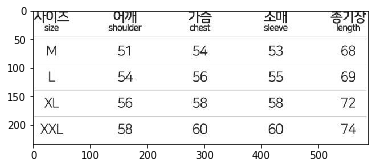

In [47]:
plt.imshow(table_list[9][0].img)

In [ ]:
test_b = find_table(test_a)
plt.imshow(test_b[0].img)

In [ ]:
for test_ in enumerate(test_path_list):
    fig, axes = plt.subplots(1, 1, figsize=(15,15))
    plt.title(f'{test_[:-4]}')
    axes.imshow(img)
    axes.axis('off')